<a href="https://colab.research.google.com/github/audwls4545/metaverse/blob/main/cifar10_tf.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from tensorflow.keras.datasets import cifar10

In [ ]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
print(X_train.shape, X_test.shape)

170498071/170498071 [==============================] - 13s 0us/step
(50000, 32, 32, 3) (10000, 32, 32, 3)


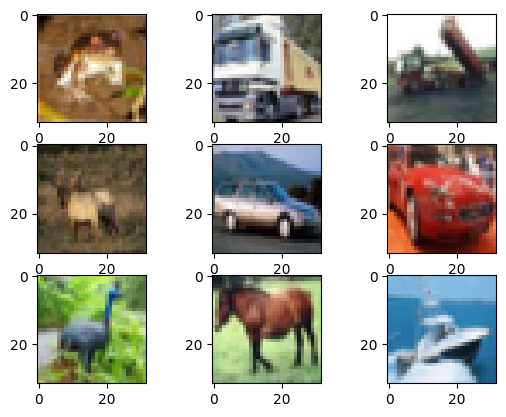

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

for temp in range(9):
    plt.subplot(3, 3, temp + 1)
    plt.imshow(X_train[temp])

In [ ]:
#이미지 전처리 scale
x_mean = np.mean(X_train, axis=(0, 1, 2)) #0번채널, 1번채널, 2번채널의 평균을 구해줌
x_mean

array([125.30691805, 122.95039414, 113.86538318])

In [ ]:
x_std = np.std(X_train, axis=(0, 1, 2))
x_std

array([62.99321928, 62.08870764, 66.70489964])

In [ ]:
X_train = (X_train-x_mean) / x_std
X_test = (X_test-x_mean) / x_std

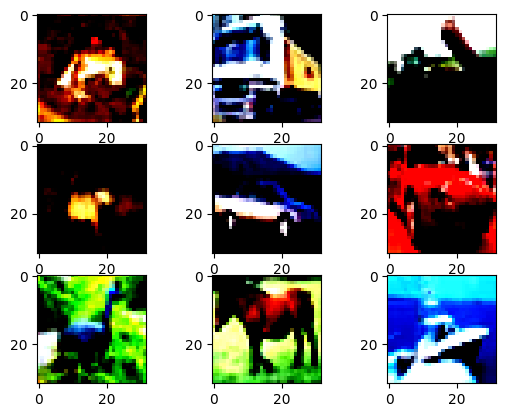

In [ ]:
for temp in range(9):
    plt.subplot(3, 3, temp + 1)
    plt.imshow(X_train[temp])

In [ ]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size = 0.3, random_state = 100)

In [ ]:
X_val.shape

(15000, 32, 32, 3)

In [ ]:
y_val.shape

(15000, 1)

In [ ]:
#X_train = np.mean(X_train, axis=3, keepdims=True)
#X_test = np.mean(X_test, axis=3, keepdims=True)

#y_train = to_categorical(y_train)
#y_test = to_categorical(y_test)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten

model = Sequential(
    [
        Conv2D(filters = 6, kernel_size = 5, strides =1, padding='same', activation = 'relu', input_shape = (32, 32, 3)), #28
        MaxPool2D(pool_size = (2, 2), strides = 2), #14
        Conv2D(filters = 16, kernel_size = 5, strides = 1, activation = 'relu'), #10
        MaxPool2D(pool_size = (2, 2), strides = 2), #5
        Conv2D(filters = 120, kernel_size = 5, strides = 1, activation = 'relu'), #1
        Flatten(),
        Dense(84, activation = 'relu'),
        Dense(10, activation = 'softmax')
    ]
)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,MaxPool2D,Dense,Flatten

model = Sequential()
model.add(Conv2D(32,3,padding='same',activation='relu',input_shape=(32,32,3)))
model.add(Conv2D(32,3,padding='same',activation='relu'))
model.add(MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model.add(Conv2D(64,3,padding='same',activation='relu'))
model.add(Conv2D(64,3,padding='same',activation='relu'))
model.add(MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model.add(Conv2D(128,3,padding='same',activation='relu'))
model.add(Conv2D(128,3,padding='same',activation='relu'))
model.add(MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model.add(Flatten())
model.add(Dense(256,activation='relu'))
model.add(Dense(10,activation='softmax'))

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 32, 32, 32)        896       
                                                                 
 conv2d_4 (Conv2D)           (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 16, 16, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 16, 16, 64)        18496     
                                                                 
 conv2d_6 (Conv2D)           (None, 16, 16, 64)        36928     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 8, 8, 64)         0         
 2D)                                                  

In [ ]:
from tensorflow.keras.optimizers import Adam

model.compile(optimizer=Adam(1e-4), loss='sparse_categorical_crossentropy', metrics=['acc']) #1e-4 == 0.0001, sparse_categorical_crossentropy -> y값을 카테고리 안했을때 사용
history = model.fit(X_train, y_train, epochs=30, batch_size=32, validation_data=(X_val,y_val))

Epoch 1/30
1094/1094 [==============================] - 23s 8ms/step - loss: 1.6154 - acc: 0.4169 - val_loss: 1.3873 - val_acc: 0.4953
Epoch 2/30
1094/1094 [==============================] - 7s 7ms/step - loss: 1.2604 - acc: 0.5504 - val_loss: 1.1964 - val_acc: 0.5812
Epoch 3/30
1094/1094 [==============================] - 8s 7ms/step - loss: 1.0931 - acc: 0.6152 - val_loss: 1.0503 - val_acc: 0.6267
Epoch 4/30
1094/1094 [==============================] - 8s 7ms/step - loss: 0.9623 - acc: 0.6603 - val_loss: 0.9826 - val_acc: 0.6503
Epoch 5/30
1094/1094 [==============================] - 7s 7ms/step - loss: 0.8599 - acc: 0.7019 - val_loss: 0.9347 - val_acc: 0.6730
Epoch 6/30
1094/1094 [==============================] - 8s 7ms/step - loss: 0.7730 - acc: 0.7320 - val_loss: 0.8672 - val_acc: 0.6940
Epoch 7/30
1094/1094 [==============================] - 7s 7ms/step - loss: 0.6946 - acc: 0.7595 - val_loss: 0.8778 - val_acc: 0.6949
Epoch 8/30
1094/1094 [==============================] - 8s 7m

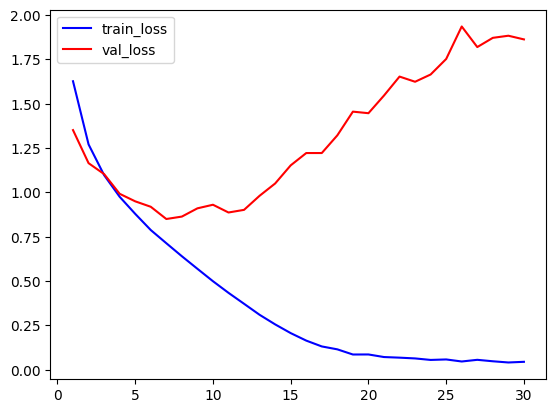

In [ ]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.plot(range(1,len(train_loss)+1), train_loss, color='blue', label='train_loss')
plt.plot(range(1,len(val_loss)+1), val_loss, color='red', label='val_loss')
plt.legend()
plt.show()

In [ ]:
model.compile(optimizer=Adam(1e-3), loss='sparse_categorical_crossentropy', metrics=['acc'])
history1 = model.fit(X_train, y_train, epochs=30, batch_size=32, validation_data=(X_val,y_val))

Epoch 1/30
1094/1094 [==============================] - 12s 8ms/step - loss: 1.4572 - acc: 0.4658 - val_loss: 1.1134 - val_acc: 0.5986
Epoch 2/30
1094/1094 [==============================] - 9s 8ms/step - loss: 0.9650 - acc: 0.6600 - val_loss: 0.8771 - val_acc: 0.6929
Epoch 3/30
1094/1094 [==============================] - 8s 8ms/step - loss: 0.7552 - acc: 0.7354 - val_loss: 0.8325 - val_acc: 0.7168
Epoch 4/30
1094/1094 [==============================] - 7s 7ms/step - loss: 0.6084 - acc: 0.7877 - val_loss: 0.7525 - val_acc: 0.7455
Epoch 5/30
1094/1094 [==============================] - 8s 8ms/step - loss: 0.4922 - acc: 0.8278 - val_loss: 0.8163 - val_acc: 0.7303
Epoch 6/30
1094/1094 [==============================] - 9s 8ms/step - loss: 0.3936 - acc: 0.8611 - val_loss: 0.8112 - val_acc: 0.7388
Epoch 7/30
1094/1094 [==============================] - 10s 9ms/step - loss: 0.3232 - acc: 0.8858 - val_loss: 0.9063 - val_acc: 0.7413
Epoch 8/30
1094/1094 [==============================] - 9s 8

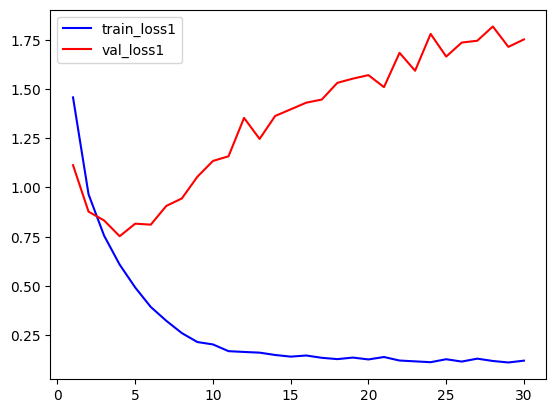

In [ ]:
train_loss1 = history1.history['loss']
val_loss1 = history1.history['val_loss']

plt.plot(range(1,len(train_loss1)+1), train_loss1, color='blue', label='train_loss1')
plt.plot(range(1,len(val_loss1)+1), val_loss1, color='red', label='val_loss1')
plt.legend()
plt.show()

In [ ]:
model.compile(optimizer=Adam(5e-5), loss='sparse_categorical_crossentropy', metrics=['acc'])
history2 = model.fit(X_train, y_train, epochs=30, batch_size=32, validation_data=(X_val,y_val))

Epoch 1/30
1094/1094 [==============================] - 12s 8ms/step - loss: 1.7248 - acc: 0.3705 - val_loss: 1.4781 - val_acc: 0.4702
Epoch 2/30
1094/1094 [==============================] - 8s 8ms/step - loss: 1.4034 - acc: 0.4969 - val_loss: 1.3233 - val_acc: 0.5331
Epoch 3/30
1094/1094 [==============================] - 9s 8ms/step - loss: 1.2792 - acc: 0.5455 - val_loss: 1.2375 - val_acc: 0.5591
Epoch 4/30
1094/1094 [==============================] - 8s 7ms/step - loss: 1.1754 - acc: 0.5879 - val_loss: 1.1622 - val_acc: 0.5883
Epoch 5/30
1094/1094 [==============================] - 9s 8ms/step - loss: 1.0904 - acc: 0.6167 - val_loss: 1.0810 - val_acc: 0.6194
Epoch 6/30
1094/1094 [==============================] - 9s 8ms/step - loss: 1.0178 - acc: 0.6445 - val_loss: 1.0958 - val_acc: 0.6119
Epoch 7/30
1094/1094 [==============================] - 8s 7ms/step - loss: 0.9553 - acc: 0.6683 - val_loss: 1.0433 - val_acc: 0.6371
Epoch 8/30
1094/1094 [==============================] - 9s 8m

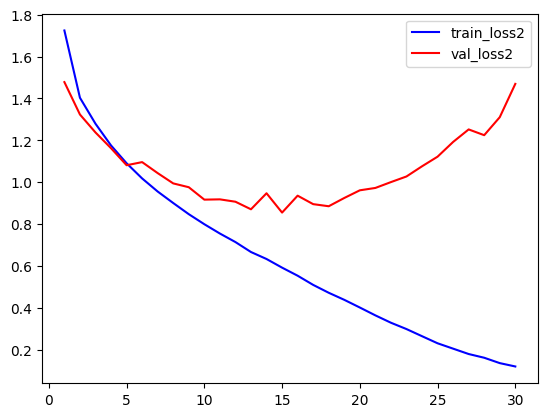

In [ ]:
train_loss2 = history2.history['loss']
val_loss2 = history2.history['val_loss']

plt.plot(range(1,len(train_loss2)+1), train_loss2, color='blue', label='train_loss2')
plt.plot(range(1,len(val_loss2)+1), val_loss2, color='red', label='val_loss2')
plt.legend()
plt.show()

In [ ]:
from tensorflow.keras.layers import Dropout

model_d = Sequential()
model_d.add(Conv2D(32,3,padding='same',activation='relu',input_shape=(32,32,3)))
model_d.add(Conv2D(32,3,padding='same',activation='relu'))
model_d.add(MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model_d.add(Dropout(0.2))
model_d.add(Conv2D(64,3,padding='same',activation='relu'))
model_d.add(Conv2D(64,3,padding='same',activation='relu'))
model_d.add(MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model_d.add(Dropout(0.2))
model_d.add(Conv2D(128,3,padding='same',activation='relu'))
model_d.add(Conv2D(128,3,padding='same',activation='relu'))
model_d.add(MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model_d.add(Dropout(0.2))
model_d.add(Flatten())
model_d.add(Dense(256,activation='relu'))
model_d.add(Dense(10,activation='softmax'))

model_d.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 32, 32, 32)        896       
                                                                 
 conv2d_22 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 dropout (Dropout)           (None, 16, 16, 32)        0         
                                                                 
 conv2d_23 (Conv2D)          (None, 16, 16, 64)        18496     
                                                                 
 conv2d_24 (Conv2D)          (None, 16, 16, 64)        36928     
                                                      

In [ ]:
model_d.compile(optimizer=Adam(5e-5),loss='sparse_categorical_crossentropy',metrics=['acc'])
history_d = model_d.fit(X_train,y_train,epochs=30,batch_size=32,validation_data=(X_val,y_val))

Epoch 1/30
1094/1094 [==============================] - 13s 9ms/step - loss: 1.8495 - acc: 0.3266 - val_loss: 1.5824 - val_acc: 0.4275
Epoch 2/30
1094/1094 [==============================] - 9s 8ms/step - loss: 1.5392 - acc: 0.4427 - val_loss: 1.4098 - val_acc: 0.4900
Epoch 3/30
1094/1094 [==============================] - 9s 8ms/step - loss: 1.4197 - acc: 0.4896 - val_loss: 1.3298 - val_acc: 0.5243
Epoch 4/30
1094/1094 [==============================] - 8s 8ms/step - loss: 1.3247 - acc: 0.5270 - val_loss: 1.2569 - val_acc: 0.5550
Epoch 5/30
1094/1094 [==============================] - 9s 8ms/step - loss: 1.2495 - acc: 0.5560 - val_loss: 1.1850 - val_acc: 0.5791
Epoch 6/30
1094/1094 [==============================] - 9s 8ms/step - loss: 1.1880 - acc: 0.5783 - val_loss: 1.1084 - val_acc: 0.6041
Epoch 7/30
1094/1094 [==============================] - 8s 8ms/step - loss: 1.1289 - acc: 0.6008 - val_loss: 1.0649 - val_acc: 0.6234
Epoch 8/30
1094/1094 [==============================] - 9s 8m

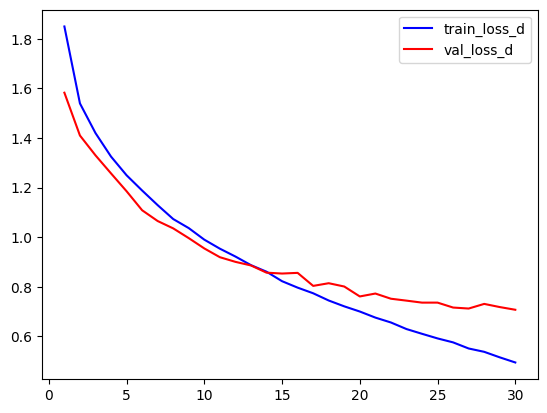

In [ ]:
train_loss_d = history_d.history['loss']
val_loss_d = history_d.history['val_loss']

plt.plot(range(1,len(train_loss_d)+1), train_loss_d, color='blue', label='train_loss_d')
plt.plot(range(1,len(val_loss_d)+1), val_loss_d, color='red', label='val_loss_d')
plt.legend()
plt.show()

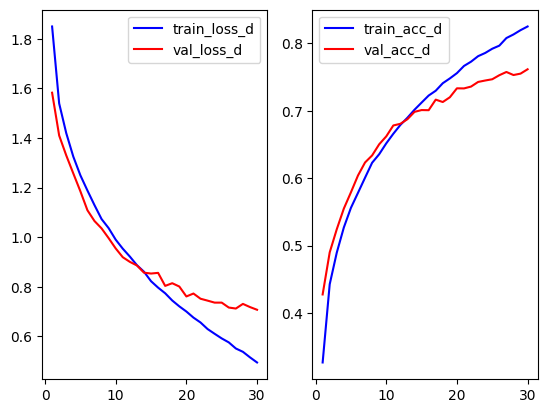

In [ ]:
train_loss_d = history_d.history['loss']
val_loss_d = history_d.history['val_loss']
train_acc_d = history_d.history['acc']
val_acc_d = history_d.history['val_acc']

plt.subplot(1,2,1)
plt.plot(range(1,len(train_loss_d)+1), train_loss_d, color='blue', label='train_loss_d')
plt.plot(range(1,len(val_loss_d)+1), val_loss_d, color='red', label='val_loss_d')
plt.legend()

plt.subplot(1,2,2)
plt.plot(range(1,len(train_loss_d)+1),train_acc_d,color='blue',label='train_acc_d')
plt.plot(range(1,len(val_loss_d)+1),val_acc_d,color='red',label='val_acc_d')
plt.legend()
plt.show()

In [ ]:
model_d.evaluate(X_test, y_test)

313/313 [==============================] - 1s 5ms/step - loss: 0.7288 - acc: 0.7560


[0.72880619764328, 0.7559999823570251]

In [ ]:
from tensorflow.keras.layers import Dropout

model_e = Sequential()
model_e.add(Conv2D(32,3,padding='same',activation='relu',input_shape=(32,32,3)))
model_e.add(Conv2D(32,3,padding='same',activation='relu'))
model_e.add(MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model_e.add(Dropout(0.3))
model_e.add(Conv2D(64,3,padding='same',activation='relu'))
model_e.add(Conv2D(64,3,padding='same',activation='relu'))
model_e.add(MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model_e.add(Dropout(0.3))
model_e.add(Conv2D(128,3,padding='same',activation='relu'))
model_e.add(Conv2D(128,3,padding='same',activation='relu'))
model_e.add(MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model_e.add(Dropout(0.3))
model_e.add(Flatten())
model_e.add(Dense(256,activation='relu'))
model_e.add(Dense(10,activation='softmax'))

model_e.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_33 (Conv2D)          (None, 32, 32, 32)        896       
                                                                 
 conv2d_34 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 dropout_6 (Dropout)         (None, 16, 16, 32)        0         
                                                                 
 conv2d_35 (Conv2D)          (None, 16, 16, 64)        18496     
                                                                 
 conv2d_36 (Conv2D)          (None, 16, 16, 64)        36928     
                                                      

In [ ]:
model_e.compile(optimizer=Adam(5e-5),loss='sparse_categorical_crossentropy',metrics=['acc'])
history_e = model_e.fit(X_train,y_train,epochs=30,batch_size=32,validation_data=(X_val,y_val))

Epoch 1/30
1094/1094 [==============================] - 12s 9ms/step - loss: 1.9162 - acc: 0.2971 - val_loss: 1.6086 - val_acc: 0.4034
Epoch 2/30
1094/1094 [==============================] - 8s 7ms/step - loss: 1.5472 - acc: 0.4339 - val_loss: 1.4762 - val_acc: 0.4668
Epoch 3/30
1094/1094 [==============================] - 9s 8ms/step - loss: 1.4291 - acc: 0.4794 - val_loss: 1.3474 - val_acc: 0.5153
Epoch 4/30
1094/1094 [==============================] - 9s 8ms/step - loss: 1.3458 - acc: 0.5133 - val_loss: 1.2557 - val_acc: 0.5541
Epoch 5/30
1094/1094 [==============================] - 8s 8ms/step - loss: 1.2762 - acc: 0.5430 - val_loss: 1.1855 - val_acc: 0.5837
Epoch 6/30
1094/1094 [==============================] - 9s 8ms/step - loss: 1.2123 - acc: 0.5662 - val_loss: 1.1390 - val_acc: 0.5974
Epoch 7/30
1094/1094 [==============================] - 9s 9ms/step - loss: 1.1581 - acc: 0.5894 - val_loss: 1.1570 - val_acc: 0.5881
Epoch 8/30
1094/1094 [==============================] - 10s 9

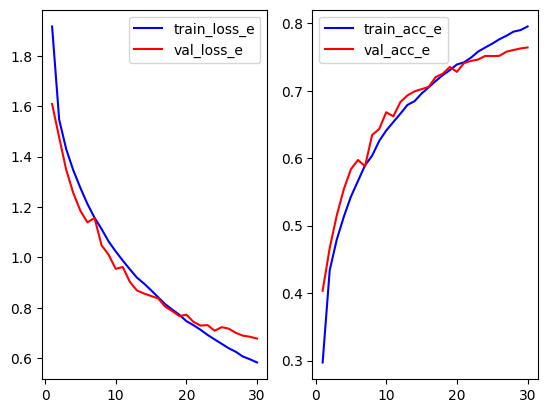

In [ ]:
train_loss_e = history_e.history['loss']
val_loss_e = history_e.history['val_loss']
train_acc_e = history_e.history['acc']
val_acc_e = history_e.history['val_acc']

plt.subplot(1,2,1)
plt.plot(range(1,len(train_loss_e)+1), train_loss_e, color='blue', label='train_loss_e')
plt.plot(range(1,len(val_loss_e)+1), val_loss_e, color='red', label='val_loss_e')
plt.legend()

plt.subplot(1,2,2)
plt.plot(range(1,len(train_loss_e)+1),train_acc_e,color='blue',label='train_acc_e')
plt.plot(range(1,len(val_loss_e)+1),val_acc_e,color='red',label='val_acc_e')
plt.legend()
plt.show()

In [ ]:
model_e.evaluate(X_test, y_test)

313/313 [==============================] - 1s 5ms/step - loss: 0.6930 - acc: 0.7619


[0.6929954886436462, 0.761900007724762]

In [ ]:
model_e_1 = Sequential()
model_e_1.add(Conv2D(32,3,padding='same',activation='relu',input_shape=(32,32,3)))
model_e_1.add(Conv2D(32,3,padding='same',activation='relu'))
model_e_1.add(MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model_e_1.add(Dropout(0.3))
model_e_1.add(Conv2D(64,3,padding='same',activation='relu'))
model_e_1.add(Conv2D(64,3,padding='same',activation='relu'))
model_e_1.add(MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model_e_1.add(Dropout(0.3))
model_e_1.add(Conv2D(128,3,padding='same',activation='relu'))
model_e_1.add(Conv2D(128,3,padding='same',activation='relu'))
model_e_1.add(MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model_e_1.add(Dropout(0.3))
model_e_1.add(Flatten())
model_e_1.add(Dense(256,activation='relu'))
model_e_1.add(Dense(10,activation='softmax'))

model_e_1.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_51 (Conv2D)          (None, 32, 32, 32)        896       
                                                                 
 conv2d_52 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d_26 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 dropout_15 (Dropout)        (None, 16, 16, 32)        0         
                                                                 
 conv2d_53 (Conv2D)          (None, 16, 16, 64)        18496     
                                                                 
 conv2d_54 (Conv2D)          (None, 16, 16, 64)        36928     
                                                      

In [ ]:
from keras.callbacks import EarlyStopping
es = EarlyStopping(monitor = 'val_loss', mode = 'min', patience = 3)
model_e_1.compile(optimizer=Adam(4e-4),loss='sparse_categorical_crossentropy',metrics=['acc'])
history_e_1 = model_e_1.fit(X_train,y_train,epochs=50,batch_size=128,validation_data=(X_val,y_val), callbacks=[es])

Epoch 1/50
274/274 [==============================] - 8s 20ms/step - loss: 1.7297 - acc: 0.3653 - val_loss: 1.4035 - val_acc: 0.4928
Epoch 2/50
274/274 [==============================] - 5s 16ms/step - loss: 1.3311 - acc: 0.5163 - val_loss: 1.1697 - val_acc: 0.5777
Epoch 3/50
274/274 [==============================] - 5s 17ms/step - loss: 1.1483 - acc: 0.5892 - val_loss: 1.0110 - val_acc: 0.6430
Epoch 4/50
274/274 [==============================] - 5s 17ms/step - loss: 1.0165 - acc: 0.6395 - val_loss: 0.9266 - val_acc: 0.6703
Epoch 5/50
274/274 [==============================] - 5s 17ms/step - loss: 0.9223 - acc: 0.6723 - val_loss: 0.8379 - val_acc: 0.7026
Epoch 6/50
274/274 [==============================] - 5s 17ms/step - loss: 0.8401 - acc: 0.7041 - val_loss: 0.7828 - val_acc: 0.7230
Epoch 7/50
274/274 [==============================] - 4s 16ms/step - loss: 0.7707 - acc: 0.7269 - val_loss: 0.7240 - val_acc: 0.7482
Epoch 8/50
274/274 [==============================] - 5s 17ms/step - 

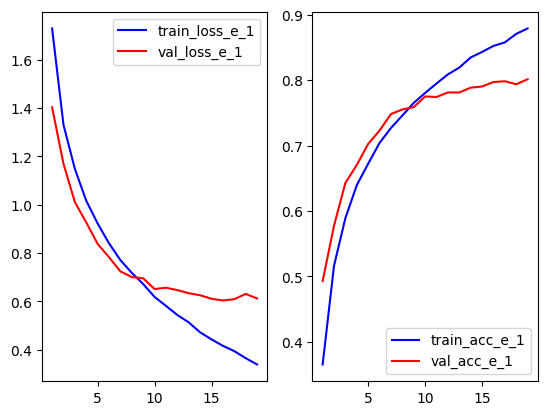

In [ ]:
train_loss_e_1 = history_e_1.history['loss']
val_loss_e_1 = history_e_1.history['val_loss']
train_acc_e_1 = history_e_1.history['acc']
val_acc_e_1 = history_e_1.history['val_acc']

plt.subplot(1,2,1)
plt.plot(range(1,len(train_loss_e_1)+1), train_loss_e_1, color='blue', label='train_loss_e_1')
plt.plot(range(1,len(val_loss_e_1)+1), val_loss_e_1, color='red', label='val_loss_e_1')
plt.legend()

plt.subplot(1,2,2)
plt.plot(range(1,len(train_loss_e_1)+1),train_acc_e_1,color='blue',label='train_acc_e_1')
plt.plot(range(1,len(val_loss_e_1)+1),val_acc_e_1,color='red',label='val_acc_e_1')
plt.legend()
plt.show()

In [ ]:
model_e_1.evaluate(X_test, y_test)

313/313 [==============================] - 1s 4ms/step - loss: 0.6401 - acc: 0.7945


[0.6401469707489014, 0.7944999933242798]

In [ ]:
model_e_2 = Sequential()
model_e_2.add(Conv2D(32,3,padding='same',activation='relu',input_shape=(32,32,3)))
model_e_2.add(Conv2D(32,3,padding='same',activation='relu'))
model_e_2.add(MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model_e_2.add(Dropout(0.3))
model_e_2.add(Conv2D(64,3,padding='same',activation='relu'))
model_e_2.add(Conv2D(64,3,padding='same',activation='relu'))
model_e_2.add(MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model_e_2.add(Dropout(0.3))
model_e_2.add(Conv2D(128,3,padding='same',activation='relu'))
model_e_2.add(Conv2D(128,3,padding='same',activation='relu'))
model_e_2.add(MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
model_e_2.add(Dropout(0.3))
model_e_2.add(Flatten())
model_e_2.add(Dense(256,activation='relu'))
model_e_2.add(Dense(10,activation='softmax'))

model_e_2.summary()

NameError: ignored

In [ ]:
es = EarlyStopping(monitor = 'val_loss', mode = 'min', patience = 3)
model_e_2.compile(optimizer=Adam(4e-4),loss='sparse_categorical_crossentropy',metrics=['acc'])
history_e_2 = model_e_2.fit(X_train,y_train,epochs=50,batch_size=128,validation_data=(X_val,y_val), callbacks=[es])

In [ ]:
train_loss_e_2 = history_e_2.history['loss']
val_loss_e_2 = history_e_2.history['val_loss']
train_acc_e_2 = history_e_2.history['acc']
val_acc_e_2 = history_e_2.history['val_acc']

plt.subplot(1,2,1)
plt.plot(range(1,len(train_loss_e_2)+1), train_loss_e_2, color='blue', label='train_loss_e_2')
plt.plot(range(1,len(val_loss_e_2)+1), val_loss_e_2, color='red', label='val_loss_e_2')
plt.legend()

plt.subplot(1,2,2)
plt.plot(range(1,len(train_loss_e_2)+1),train_acc_e_2,color='blue',label='train_acc_e_2')
plt.plot(range(1,len(val_loss_e_2)+1),val_acc_e_2,color='red',label='val_acc_e_2')
plt.legend()
plt.show()

NameError: ignored

In [ ]:
model_e_2.evaluate(X_test, y_test)

NameError: ignored

In [ ]:
model.layers

In [ ]:
import tensorflow as tf

get_output = []

for layer in model.layers:
    get_output.append(layer.output)

layer_name = []
for layer in model.layers:
    layer_name.append(layer.name)

In [ ]:
X_train[0].shape

(32, 32, 3)

In [ ]:
test_img = np.reshape(X_train[0],(-1,32,32,3))
visual_model = tf.keras.models.Model(inputs = model.input , outputs=get_output)
feature_maps = visual_model.predict(test_img)

1/1 [==============================] - 0s 362ms/step


In [ ]:
feature_maps[0].shape

(1, 32, 32, 32)

<ipython-input-25-6c834fbba65a>:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


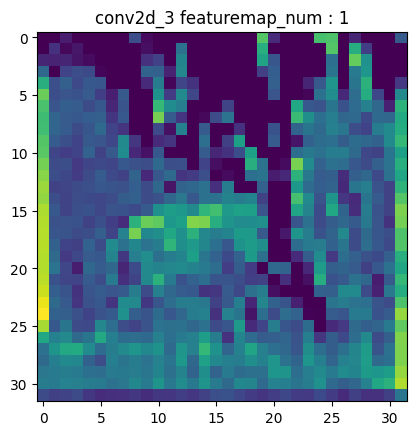

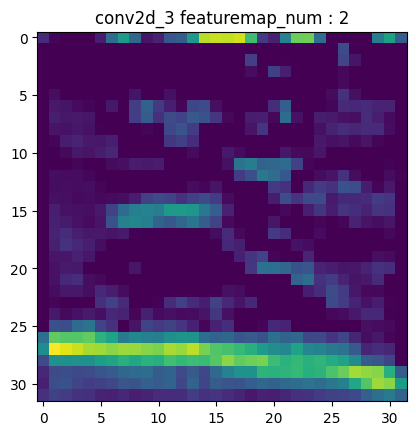

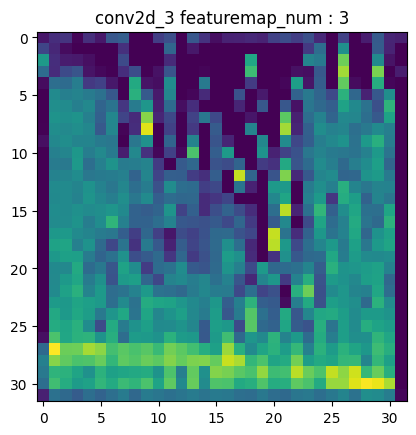

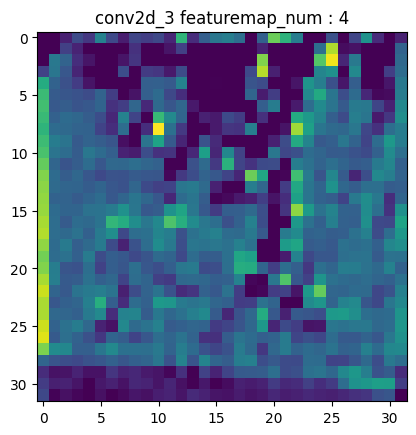

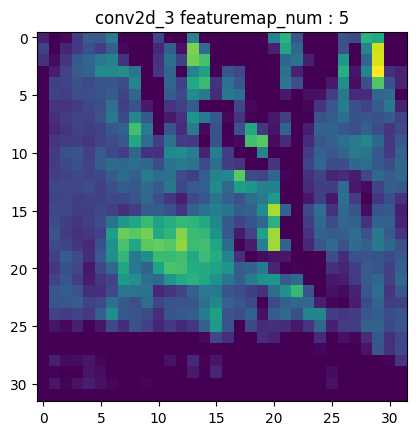

...

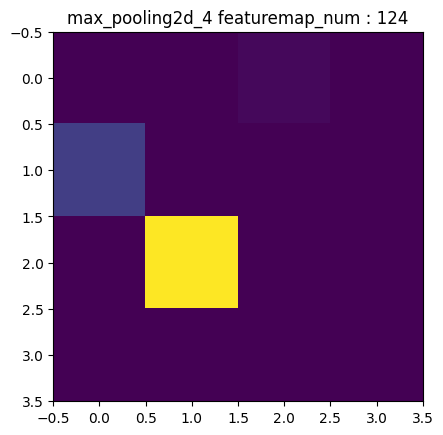

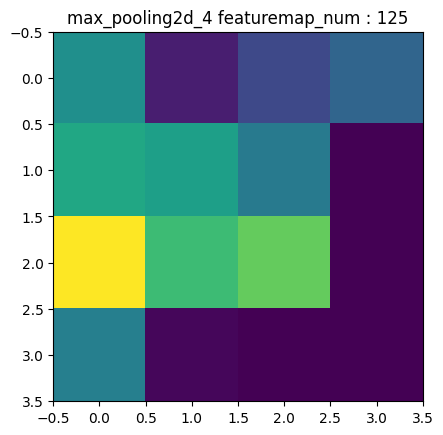

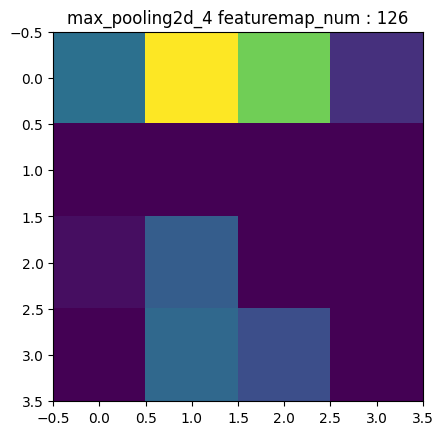

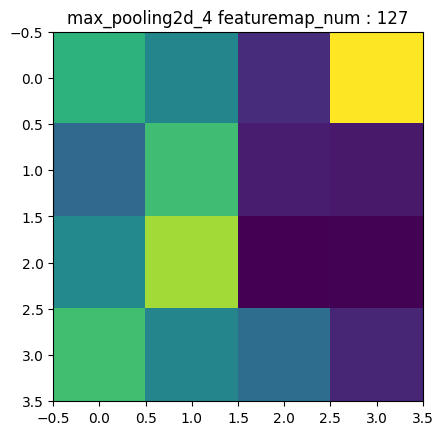

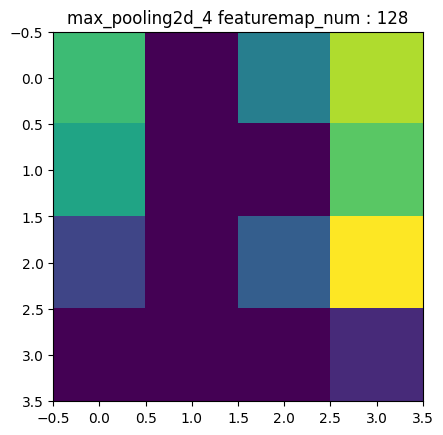

In [ ]:
for layer_name, feature_map in zip(layer_name, feature_maps):
    if(len(feature_map.shape)==4):
        img_size = feature_map.shape[1]
        feature_size = feature_map.shape[-1]

        for temp in range(feature_size):
            x = feature_map[0,:,:,temp]
            plt.figure()
            plt.title(f'{layer_name} featuremap_num : {temp+1}')
            plt.imshow(x,cmap='viridis')

In [ ]:
model.save('./test')

In [ ]:
#모델 저장
model.save('test.h5')

In [ ]:
#저장된 모델 사용
new_model = tf.keras.models.load_model('test.h5')

In [ ]:
#가중치만 저장
model.save_weights('test_weight')

In [ ]:
#저장된 weight 사용
new_model.load_weights('test_weight')